In [6]:
import os
os.environ["JAX_PLATFORMS"] = "cpu"
# os.environ["CUDA_VISIBLE_DEVICES"] = "xx"  # If GPU usage is required
import jax
jax.config.update("jax_enable_x64", True)
import jax.numpy as jnp

from differential_geometry.tensor_calculus import DifferentialGeometry as diffgeo
from differential_geometry.vectorized_tensor_calculus import VectorizedDifferentialGeometry as vdg 
from general_relativity.metrics.kerr import kerr_schild_cartesian_metric
from einstein_fields.utils.utils_train import get_model_and_params_checkpoint 

import matplotlib.pyplot as plt
plt.rcParams.update({
    "text.usetex": False, 
    "font.family": "serif",
    "font.sans-serif": ["Helvetica", "Arial"],
    "axes.titlesize": 8,
    "axes.labelsize": 6,
    "axes.linewidth": 1.0,
    "lines.linewidth": 3.0,
    "lines.markersize": 6,
    "xtick.labelsize": 20,
    "ytick.labelsize": 20,
    "xtick.direction": "in",
    "ytick.direction": "in",
    "xtick.major.size": 4,
    "ytick.major.size": 4,
    "legend.fontsize": 6,
    "legend.frameon": False,
    "figure.dpi": 300,
    "savefig.dpi": 600,
    "figure.figsize": (2.0, 2.0),  
    "figure.facecolor": "white",
    "axes.grid": True,
    "grid.alpha": 0.25,
    "pdf.fonttype": 42, 
})

In [1]:
kerr_metric = lambda coords: kerr_schild_cartesian_metric(coords, 1.0, 0.7)

In [4]:
def get_quantities(metric: vdg, coords: jax.Array) -> dict:
    """
    Get the quantities of interest from the metric.
    """
    jacobian = metric.metric_jacobian(coords)

    hessian = metric.metric_hessian(coords)

    # Compute Christoffel symbols
    christoffel_symbols = metric.christoffel_symbols(coords)
    
    # Compute Riemann curvature tensor
    riemann_tensor = metric.riemann_tensor(coords)

    kretschmann = metric.kretschmann_invariant(coords).reshape(-1, 1)
    
    return {
        "Jacobian": jacobian,
        "Hessian": hessian,
        "Christoffel symbols": christoffel_symbols,
        "Riemann tensor": riemann_tensor,
        "Kretschmann": kretschmann
    }

In [ ]:
checkpoint_path = "../EinFields/differential_geometry/examples/tensor_tomography_examples"

model, params_metric = get_model_and_params_checkpoint(os.path.join(checkpoint_path, "metric_training"))

metric_fn = lambda coords: model.apply(params_metric, coords).reshape(4, 4)

model, params_jacobian = get_model_and_params_checkpoint(os.path.join(checkpoint_path, "jacobian_training"))

metric_jacobian_fn = lambda coords: model.apply(params_jacobian, coords).reshape(4, 4)

model, params_hessian = get_model_and_params_checkpoint(os.path.join(checkpoint_path, "hessian_training"))

metric_hessian_fn = lambda coords: model.apply(params_hessian, coords).reshape(4, 4)

### Automatic vectorization wrapper on the functions 

In [12]:
metric_fn_vdg = vdg(diffgeo(metric_fn))
metric_jacobian_fn_vdg = vdg(diffgeo(metric_jacobian_fn))
metric_hessian_fn_vdg = vdg(diffgeo(metric_hessian_fn))

In [13]:
N_pts = 1024
dense_grid_line = jnp.stack([
    jnp.zeros((N_pts,)),
    jnp.linspace(-1.5, 1.5, N_pts),
    jnp.zeros((N_pts,)),
    0.2 + jnp.zeros((N_pts,))
], axis=-1)

In [14]:
kerr_metric_dict = get_quantities(vdg(diffgeo(kerr_metric)), dense_grid_line)

In [15]:
metric_train_dict = get_quantities(metric_fn_vdg, dense_grid_line)
metric_jacobian_train_dict = get_quantities(metric_jacobian_fn_vdg, dense_grid_line)
metric_hessian_train_dict = get_quantities(metric_hessian_fn_vdg, dense_grid_line)

In [30]:
def plot_tensor_comparison(
    list_indices: list[list[int]],
    metric_dict,
    jacobian_dict,
    hessian_dict,
    save_dir: str,
    file_name: str,
    tensor_name: str,
    error_factor: float = 10.0,
    figure_size_per_plot: tuple = (6, 4)
):
    rows = len(list_indices)
    fig, axes = plt.subplots(
        rows, 3,
        figsize=(3 * figure_size_per_plot[0], rows * figure_size_per_plot[1]),
        squeeze=False
    )

    for i, idx in enumerate(list_indices):
        metric = metric_dict[tensor_name][..., *idx]
        jacobian = jacobian_dict[tensor_name][..., *idx]
        hessian = hessian_dict[tensor_name][..., *idx]
        ground_truth = kerr_metric_dict[tensor_name][..., *idx]

        error_metric = metric - ground_truth
        error_jacobian = jacobian - ground_truth
        error_hessian = hessian - ground_truth

        indices_str = ','.join(map(str, idx))

        # Plot 1: EinFields
        ax = axes[i, 0]
        line_gt, = ax.plot(dense_grid_line[:, 1], ground_truth, 'mediumseagreen', label='Groundtruth')
        line_metric, = ax.plot(dense_grid_line[:, 1], metric, color='orangered', linestyle='-.', label='EinFields')
        line_err, = ax.plot(dense_grid_line[:, 1], error_factor * error_metric, color='darkslategray',
                            lw=2.5, linestyle='-.', label=f'{error_factor}x Error')

        ax.set_title(f"[{indices_str}] component", fontsize=40)
        ax.grid(True, alpha=0.3)

        # Plot 2: EinFields (+Jac)
        ax = axes[i, 1]
        ax.plot(dense_grid_line[:, 1], ground_truth, 'mediumseagreen')
        line_jacobian, = ax.plot(dense_grid_line[:, 1], jacobian, 'violet', linestyle='-.', label='EinFields (+Jac)')
        ax.plot(dense_grid_line[:, 1], error_factor * error_jacobian, color='darkslategray',
                lw=2.5, linestyle='-.')
        ax.set_title(f"[{indices_str}] component", fontsize=40)
        ax.grid(True, alpha=0.3)

        # Plot 3: EinFields (+Jac + Hess)
        ax = axes[i, 2]
        ax.plot(dense_grid_line[:, 1], ground_truth, 'mediumseagreen')
        line_hessian, = ax.plot(dense_grid_line[:, 1], hessian, 'mediumvioletred', linestyle='-.', label='EinFields (+Jac + Hess)')
        ax.plot(dense_grid_line[:, 1], error_factor * error_hessian, color='darkslategray',
                lw=2.5, linestyle='-.')
        ax.set_title(f"[{indices_str}] component", fontsize=40)
        ax.grid(True, alpha=0.3)

    # Shared x/y labels in large font
    fig.supxlabel(r'$x$ coordinate', fontsize=55, y=0.04)
    fig.supylabel(f'{tensor_name} value', fontsize=55, x=0.01)

    # Shared legend with larger font
    shared_labels = ['Groundtruth', 'EinFields', f'{error_factor}x Error', 'EinFields (+Jac)', 'EinFields (+Jac + Hess)']
    fig.legend(
        labels=shared_labels,
        loc='lower center',
        ncol=5,
        fontsize=40,   # Increased fontsize
        frameon=False,
        bbox_to_anchor=(0.5, -0.03)
    )

    # Tight layout for clean spacing
    plt.tight_layout(h_pad=2.0, w_pad=1.0, rect=[0.04, 0.08, 1, 0.96])

    # Save
    save_path = os.path.join(
        save_dir,
        f"{file_name}_tomography.pdf" if file_name else f"{tensor_name}_tomography.pdf"
    )
    plt.savefig(save_path, bbox_inches='tight')
    plt.show()

In [ ]:
key = jax.random.PRNGKey(15)

In [18]:
key, subkey = jax.random.split(key)
random_indices_jacobian = jax.random.randint(key, shape=(3, 3), minval=0, maxval=4)

print(random_indices_jacobian)

[[2 3 1]
 [0 2 2]
 [1 3 2]]


In [19]:
plot_tensor_comparison(
    list_indices = random_indices_jacobian,
    metric_dict=metric_train_dict,
    jacobian_dict=metric_jacobian_train_dict,
    hessian_dict=metric_hessian_train_dict,
    save_dir=f"..",
    file_name="jacobian",
    error_factor=100.0,
    tensor_name="Jacobian",
    figure_size_per_plot=(8, 8)
)

In [21]:
key, subkey = jax.random.split(key)
random_indices_hessian = jax.random.randint(key, shape=(3, 4), minval=0, maxval=4)
# [2, 2, 1, 1]
print(random_indices_hessian)

[[0 2 2 1]
 [0 2 0 2]
 [3 0 0 2]]


In [22]:
plot_tensor_comparison(
    list_indices = random_indices_hessian,
    metric_dict=metric_train_dict,
    jacobian_dict=metric_jacobian_train_dict,
    hessian_dict=metric_hessian_train_dict,
    save_dir=f"..",
    file_name=None,
    error_factor=100.0,
    tensor_name="Hessian",
    figure_size_per_plot=(8.0, 8.0)
)

In [23]:
key, subkey = jax.random.split(key)
random_indices_christoffel = jax.random.randint(key, shape=(3, 3), minval=0, maxval=4)
# [2, 2, 1]
print(random_indices_christoffel)

[[3 2 1]
 [2 1 2]
 [0 3 2]]


In [24]:
plot_tensor_comparison(
    list_indices = random_indices_christoffel,
    metric_dict=metric_train_dict,
    jacobian_dict=metric_jacobian_train_dict,
    hessian_dict=metric_hessian_train_dict,
    save_dir=f"..",
    file_name=None,
    error_factor=10.0,
    tensor_name="Christoffel symbols",
    figure_size_per_plot=(8, 8)
)

In [25]:
key, subkey = jax.random.split(key)
random_indices_riemann = jax.random.randint(key, shape=(3, 4), minval=0, maxval=4)
# [2, 2, 1]
print(random_indices_riemann)

[[2 2 3 1]
 [3 1 1 0]
 [1 2 3 3]]


In [26]:
plot_tensor_comparison(
    list_indices = random_indices_riemann,
    metric_dict=metric_train_dict,
    jacobian_dict=metric_jacobian_train_dict,
    hessian_dict=metric_hessian_train_dict,
    save_dir=f"..",
    file_name=None,
    error_factor=10.0,
    tensor_name="Riemann tensor",
    figure_size_per_plot=(8.5, 8.5)
)

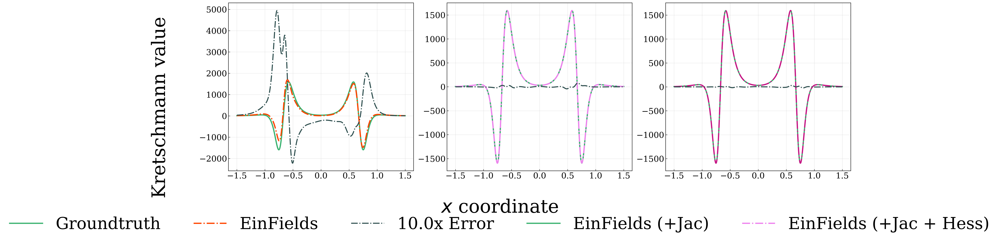

In [31]:
plot_tensor_comparison(
    list_indices = [[0]],
    metric_dict=metric_train_dict,
    jacobian_dict=metric_jacobian_train_dict,
    hessian_dict=metric_hessian_train_dict,
    save_dir=f"..",
    file_name=None,
    error_factor=10.0,
    tensor_name="Kretschmann",
    figure_size_per_plot=(8, 8)
)

### change x and y label position in the plotting function to bbox_to_anchor=(0.5, -0.09) and label size 45 and comment indices, since it is not required here